# Visually checking a 3D-Embedding

In [1]:
import os
from os.path import join, isdir, isfile, abspath, dirname, splitext, basename, split
from parse import parse
import math
import random
import itertools

from IPython.display import Markdown, display
from dotenv import load_dotenv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import sklearn
from sklearn.metrics import confusion_matrix

from misc_util.pretty_print import pretty_print as print
from derive_conceptualspace.pipeline import CustomContext, SnakeContext, load_envfiles
from derive_conceptualspace.settings import ENV_PREFIX, get_setting
from derive_conceptualspace import settings
from derive_conceptualspace.semantic_directions.create_candidate_svm import display_svm, display_svm2
from derive_conceptualspace.create_spaces.create_embedding import show_close_descriptions

plt.rcParams['figure.figsize'] = [8, 5]

<span style="font-size:11pt">Config-File /home/chris/Documents/UNI_neu/Masterarbeit/Derive_Conceptualspace/config/derrac2015_edited.yml loaded.</span>

<span style="font-size:11pt">Running with the following settings [<span style="color: #0000ff">308494e172</span>]: CLASSIFIER: <span style="color: #0000ff">SVM</span>, CLASSIFIER_COMPARETO_RANKING: <span style="color: #ff0000">ppmi</span>, CLASSIFIER_SUCCMETRIC: <span style="color: #ff0000">kappa_count2rank_onlypos</span>, DATASET: <span style="color: #ff0000">siddata2022</span>, DCM_QUANT_MEASURE: <span style="color: #0000ff">count</span>, DEBUG: <span style="color: #0000ff">False</span>, EMBED_ALGO: <span style="color: #0000ff">mds</span>, EMBED_DIMENSIONS: <span style="color: #ff0000">3</span>, EXTRACTION_METHOD: <span style="color: #ff0000">tfidf</span>, KAPPA_WEIGHTS: <span style="color: #0000ff">quadratic</span>, LANGUAGE: <span style="color: #0000ff">de</span>, MIN_WORDS_PER_DESC: <span style="color: #ff0000">80</span>, PP_COMPONENTS: <span style="color: #ff0000">mfauhcsd2</span>, PRIM_LAMBDA: <span style="color: #0000ff">0.5</span>, QUANTIFICATION_MEASURE: <span style="color: #ff0000">ppmi</span>, RANDOM_SEED: <span style="color: #ff0000">None</span>, SEC_LAMBDA: <span style="color: #ff0000">0.2</span>, TRANSLATE_POLICY: <span style="color: #0000ff">onlyorig</span>, VERBOSE: <span style="color: #ff0000">False</span></span>

Counting Occurences [verbose]: 100%|██████████| 10060/10060 [00:09<00:00, 1013.55it/s]


<span style="font-size:11pt">Found 10060 candidate Terms, 10060 (100%) of which occur in at least 25 descriptions.</span>

<span style="font-size:11pt">The 25 terms that occur in the most descriptions (incl the #descriptions they occur in): seminar (5482), literatur (4201), sowie (4196), veranstaltung (3250), dabei (3165), sollen (2779), fragen (2651), teilnahme (2268), studierenden (2208), einfuhrung (2175), seminars (2101), studierende (2040), ersten (2022), grundlagen (1960), themen (1947), de (1935), uuml (1925), auml (1881), bzw (1812), ziel (1785), methoden (1757), lernen (1710), 10 (1708), anhand (1697), ouml (1687)</span>

<span style="font-size:11pt">Max value: Term <span style="color: #0000ff">nbsp</span> has value <span style="color: #0000ff">469.000</span> for doc <span style="color: #0000ff">Geschichte erleben – Umgang mit Menschen mit Behinderungen während der NS- Zeit B.1 (3)</span></span>

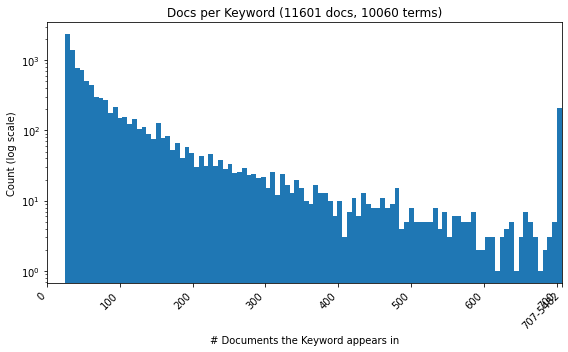

In [2]:
load_envfiles()

ctx = SnakeContext.loader_context(config={"DEBUG": False, "EMBED_DIMENSIONS": 3, "VERBOSE": False, "CLASSIFIER_COMPARETO_RANKING": "ppmi"}, warn_filters=["DifferentFileWarning"])
pp_descriptions, dcm, dissim_mat, embedding = ctx.load("pp_descriptions", "filtered_dcm", "dissim_mat", "embedding", loaders=dict(embedding=lambda **kwargs: kwargs["embedding"].embedding_))
dcm.show_info(descriptions=pp_descriptions)

In [3]:
show_close_descriptions(dissim_mat[1], pp_descriptions)
#print(ctx.display_output("embedding", ignore_err=True))
show_close_descriptions(embedding, pp_descriptions, is_embedding=True, title=f"Embedding-Distances ({get_setting('DISSIM_MEASURE')})")

<span style="font-size:11pt">Closest 10 Descriptions in Dissim-Mat:</span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Auf den Anfang kommt es an..."</span> and <span style="color: #0000ff">„Auf den Anfang kommt es an…“</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Bildungsübergänge im deutschen Schulsystem - Herausforderungen für pädagogische Fachkräfte, Eltern und Kinder"</span> and <span style="color: #0000ff">Bildungsübergänge im deutschen Schulsystem - Herausforderungen für pädagogische Fachkräfte, Eltern und Kinder</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Das Wunder von Wien". Eine Detailstudie zum Hörspiel [NDL3, WPBA]</span> and <span style="color: #0000ff">„Das Wunder von Wien“. Eine Detailstudie zum Hörspiel (NDL3, WPBA)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Gebt den Kindern das Kommando!" - Demokratiepädagogische Ansätze in der Schule (Gruppe 1)</span> and <span style="color: #0000ff">"Gebt den Kindern das Kommando!" - Demokratiepädagogische Ansätze in der Schule (Gruppe 2)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Sozialer Brennpunkt" Körper</span> and <span style="color: #0000ff">„Sozialer Brennpunkt“ Körper</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">(Inklusive) Berufsberatung als pädagogisch relevanter Beratungsanlass (1)</span> and <span style="color: #0000ff">(Inklusive) Berufsberatung als pädagogisch relevanter Beratungsanlass (2)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.1 "Haben Sie PowerPoint oder etwas zu sagen?" Gekonnt visualisieren – Medien professionell einsetzen</span> and <span style="color: #0000ff">1.2 "Haben Sie PowerPoint oder etwas zu sagen?" Gekonnt visualisieren – Medien professionell einsetzen</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.2 Moderation - Grundlagen eines professionellen Verfahrens</span> and <span style="color: #0000ff">1.3 Moderation – Grundlagen eines professionellen Verfahrens</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.4 Moderne Korrespondenz in digitalen (Homeoffice-)Zeiten (Ref. Stefanie Dettmar)</span> and <span style="color: #0000ff">1.5 Moderne Korrespondenz in digitalen (Homeoffice-)Zeiten (Ref. Stefanie Dettmar)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">2.1 Das alltägliche Spiel: Konstruktionsprozesse von Geschlecht in der empirischen Forschung</span> and <span style="color: #0000ff">Das alltägliche Spiel: Konstruktionsprozesse von Geschlecht in der empirischen Forschung</span></span>

<span style="font-size:11pt">Closest 10 Descriptions in Embedding-Distances (norm_ang_dist):</span>

Creating dissimilarity matrix [2 procs]: 100%|██████████| 200/200 [00:01<00:00, 120.30it/s]


<span style="font-size:11pt">  <span style="color: #0000ff">"Bildungsübergänge im deutschen Schulsystem - Herausforderungen für pädagogische Fachkräfte, Eltern und Kinder"</span> and <span style="color: #0000ff">Bildungsübergänge im deutschen Schulsystem - Herausforderungen für pädagogische Fachkräfte, Eltern und Kinder</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Das Wunder von Wien". Eine Detailstudie zum Hörspiel [NDL3, WPBA]</span> and <span style="color: #0000ff">„Das Wunder von Wien“. Eine Detailstudie zum Hörspiel (NDL3, WPBA)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Gebt den Kindern das Kommando!" - Demokratiepädagogische Ansätze in der Schule (Gruppe 1)</span> and <span style="color: #0000ff">"Gebt den Kindern das Kommando!" - Demokratiepädagogische Ansätze in der Schule (Gruppe 2)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">"Sozialer Brennpunkt" Körper</span> and <span style="color: #0000ff">„Sozialer Brennpunkt“ Körper</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">(Inklusive) Berufsberatung als pädagogisch relevanter Beratungsanlass (1)</span> and <span style="color: #0000ff">(Inklusive) Berufsberatung als pädagogisch relevanter Beratungsanlass (2)</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.1 "Haben Sie PowerPoint oder etwas zu sagen?" Gekonnt visualisieren – Medien professionell einsetzen</span> and <span style="color: #0000ff">1.2 "Haben Sie PowerPoint oder etwas zu sagen?" Gekonnt visualisieren – Medien professionell einsetzen</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.1 Kommunikative Kompetenz – Probleme lösen durch Kommunikation</span> and <span style="color: #0000ff">1.2 Kommunikative Kompetenz – Probleme lösen durch Kommunikation</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.2 Gebärden lernen – Gebärdensprachkurs I</span> and <span style="color: #0000ff">1.3 Gebärden lernen – Gebärdensprachkurs</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.2 Gebärden lernen – Gebärdensprachkurs I</span> and <span style="color: #0000ff">1.3 Gebärden lernen – Gebärdensprachkurs I</span></span>

<span style="font-size:11pt">  <span style="color: #0000ff">1.2 Gebärden lernen – Gebärdensprachkurs I</span> and <span style="color: #0000ff">1.4 Gebärden lernen – Gebärdensprachkurs I</span></span>

## Calculating if known similar descriptions are close

In [11]:
if "siddata" in ctx.get_config("dataset"):
    CLOSE_DESCRIPTIONS = ["Informatik A: Algorithmen", "Informatik B: Objekt-orientierte Programmierung in Java"]
elif ctx.get_config("dataset") == "placetypes":
    CLOSE_DESCRIPTIONS = ["airplane cabin", "aircraft cabin"]

close_inds = [n for n, i in enumerate(pp_descriptions._descriptions) if i.title in CLOSE_DESCRIPTIONS]
close_dist = np.linalg.norm(embedding[close_inds[0]]-embedding[close_inds[1]])
random_pairs = random.sample(list(itertools.combinations(random.sample(list(embedding), 1000), 2)), 500)
average_dist = np.mean([np.linalg.norm(p1-p2) for p1, p2 in random_pairs])
print(f"Distances: Known close ones: {close_dist:.3f}, Average dist: {average_dist:.3f}")

<span style="font-size:11pt">Distances: Known close ones: 0.396, Average dist: 0.875</span>

## Visually checking if the SVM clusters well and if known similar descriptions are close

In [78]:
def create_svm(term, embedding, dcm, descriptions, highlight=None):
    quants = dcm.term_quants(term)
    bin_labels = np.array(quants, dtype=bool)
    svm = sklearn.svm.LinearSVC(class_weight="balanced", loss="hinge", max_iter=20000)
    svm.fit(embedding, bin_labels)
    svm_results = svm.decision_function(embedding)
    tn, fp, fn, tp = confusion_matrix(bin_labels, [i > 0 for i in svm_results]).ravel()
    precision = tp / (tp + fp); recall = tp / (tp + fn); accuracy = (tp + tn) / len(quants)
    f_one = 2*(precision*recall)/(precision+recall)
    display_svm2(embedding, np.array(bin_labels, dtype=int), svm, term=term, descriptions=descriptions, highlight=highlight, stretch_fact=0.28, bigfont=True, 
                legend_inside=True, name=f"SIDDATA 3D-MDS-Embedding and SVM splitting for term '{term}' (SVM F1: {f_one:.2f})")

/home/chris/miniconda3/envs/create_cs/lib/python3.10/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



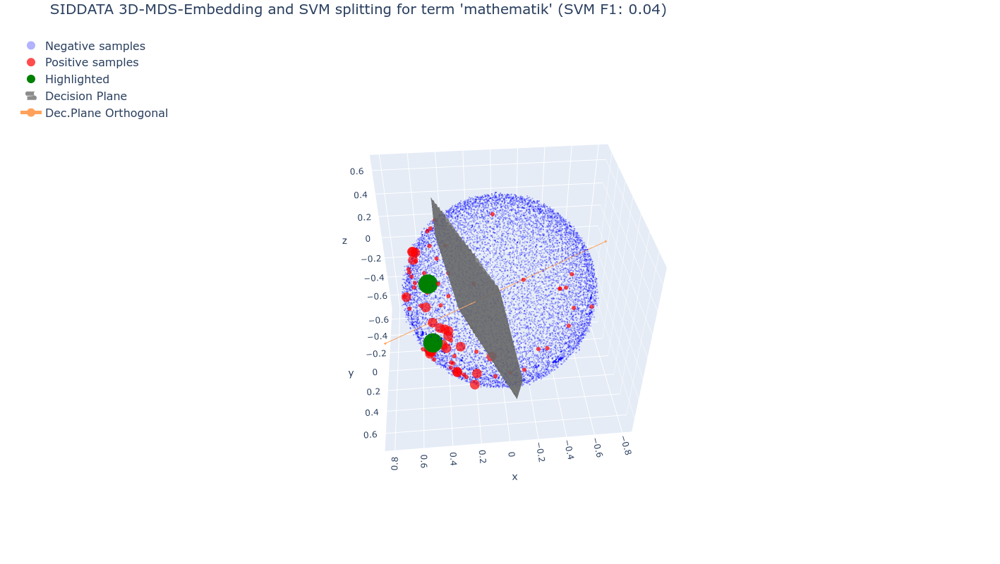

In [79]:
if ctx.get_config("dataset") == "placetypes":
    create_svm("nature", embedding, dcm, pp_descriptions, highlight=CLOSE_DESCRIPTIONS)
elif "siddata" in ctx.get_config("dataset"):
    create_svm("mathematik", embedding, dcm, pp_descriptions, highlight=CLOSE_DESCRIPTIONS)

In [ ]:
from scipy.spatial.distance import squareform, cdist, pdist
cos_to_normangdiff = lambda cosine: 2/math.pi*(np.arccos(-cosine+1))

infoab = embedding[[n for n, i in enumerate(pp_descriptions._descriptions) if i.title in CLOSE_DESCRIPTIONS]]

In [43]:
distmat = np.apply_along_axis(cos_to_normangdiff, 0, pdist(embedding, metric="cosine"))
abdiff = np.apply_along_axis(cos_to_normangdiff, 0, pdist(infoab, metric="cosine"))[0]
print(f"Normalized Angular Distance: Average {distmat.mean():.3f}, Info A & Info B: {abdiff:.3f} - Percentile: {(distmat < abdiff).sum() / len(distmat):.2%}")

<span style="font-size:11pt">Normalized Angular Distance: Average 1.000, Info A & Info B: 0.369 - Percentile: 8.18%</span>

In [44]:
distmat = pdist(embedding, metric="euclidean")
abdiff = pdist(infoab, metric="euclidean")[0]
print(f"Euclidean Distance: Average {distmat.mean():.3f}, Info A & Info B: {abdiff:.3f} - Percentile: {(distmat < abdiff).sum() / len(distmat):.2%}")

<span style="font-size:11pt">Euclidean Distance: Average 0.884, Info A & Info B: 0.396 - Percentile: 8.86%</span>

<br><br><br><br>

# Remove me

In [ ]:
NUM = 3
featureaxes = ctx.load("featureaxes")
best = [i[0] for i in sorted([(k, v["kappa_digitized_onlypos_1"]) for k, v in featureaxes["metrics"].items()], key=lambda x:x[1], reverse=True)[:NUM]]
best += [i[0] for i in sorted([(k, v["f_one"]) for k, v in featureaxes["metrics"].items()], key=lambda x:x[1], reverse=True)[:NUM]]

terms = best + list(dcm.all_terms.values())[:NUM]
if ctx.get_config("dataset") == "placetypes":
    terms += ['nature', 'ceiling', 'engine', 'athlete', 'seafood', 'shadows', 'skyscrapers', 'b737', 'monument', 'baby', 'sign', 'marine', 'iowa', 'field', 
              'buy', 'military', 'lounge', 'factory', 'road', 'education', '13thcentury', 'people', 'wait', 'travel', 'tunnel', 'treno', 'wings', 'hot', 
              'background', 'vintage', 'farmhouse', 'technology', 'building', 'horror', 'realestate', 'crane', 'slipway', 'ruin', 'national', 'morze'][:NUM]
terms

In [ ]:
for term in terms:
    create_svm(term, embedding, dcm, pp_descriptions)